In [1]:
pip install segment-anything-py

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 73.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 27.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 53.4 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: nvi

In [2]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2025-11-20 01:16:10--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.96, 3.163.189.51, 3.163.189.14, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.96|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   341MB/s    in 7.3s    

2025-11-20 01:16:17 (335 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 5.3 MB/s eta 0:00:000:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [5]:
dataset_path_rgn = "/kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])
        
        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84 
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84 
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8) 
        mask = (mask > 0.5).float()  
        return image, mask
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:    
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)
        
        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0549, 0.0667, 0.0431,  ..., 0.2824, 0.3451, 0.3451],
         [0.0784, 0.0667, 0.0431,  ..., 0.3412, 0.3569, 0.3451],
         [0.0627, 0.0392, 0.0941,  ..., 0.3020, 0.2667, 0.4118],
         ...,
         [0.1804, 0.1255, 0.0745,  ..., 0.4118, 0.3961, 0.3843],
         [0.1529, 0.1255, 0.1020,  ..., 0.5608, 0.4627, 0.5412],
         [0.0000, 0.0392, 0.1137,  ..., 0.4902, 0.5569, 0.5255]],

        [[0.0784, 0.0235, 0.0627,  ..., 0.2196, 0.1765, 0.2118],
         [0.0824, 0.0471, 0.0353,  ..., 0.1647, 0.1922, 0.2157],
         [0.0471, 0.0549, 0.0627,  ..., 0.1686, 0.2784, 0.2392],
         ...,
         [0.1765, 0.1412, 0.1137,  ..., 0.3373, 0.3569, 0.3569],
         [0.1608, 0.1098, 0.1333,  ..., 0.4157, 0.4314, 0.4941],
         [0.0431, 0.0353, 0.0745,  ..., 0.4627, 0.5294, 0.5294]],

        [[0.0627, 0.0000, 0.0588,  ..., 0.2431, 0.1765, 0.2431],
         [0.0667, 0.0863, 0.0196,  ..., 0.2118, 0.2000, 0.2118],
         [0.0667, 0.0000, 0.0353,  ..., 0.2314, 0.1922, 0.

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [24]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [25]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0  
            else:
                iou = 0.0  
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [26]:
from torchvision.ops import masks_to_boxes

def box_from_mask(mask):
    orig_shape = mask.shape 

    if mask.dim() == 4 and mask.shape[1] == 1:
        mask = mask.squeeze(1) 

    bin_mask = mask > 0.5 

    valid_mask = []
    for m in bin_mask:
        if m.sum() == 0:
            valid_mask.append(m.new_zeros(m.shape))
        else:
            valid_mask.append(m)

    valid_mask = torch.stack(valid_mask)

    if valid_mask.sum() == 0:
        B, C, H, W = orig_shape
        box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
    else:
        box = masks_to_boxes(valid_mask)
        if box.numel() == 0: 
            B, C, H, W = orig_shape
            box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
        else:
            box = box.unsqueeze(1)

    return box

In [27]:
def preprocess_image(images, transform, device):
    process_images = []
    for img in images:
        img = img.permute(1, 2, 0).cpu().numpy()
        img_resize = transform.apply_image(img)
        img_resize = torch.as_tensor(img_resize, dtype = torch.float32).permute(2, 0, 1) / 255.0
        process_images.append(img_resize)
    return torch.stack(process_images).to(device)

In [28]:
!pip install optuna

In [29]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, ReduceLROnPlateau
import optuna
from tqdm import tqdm
import warnings
from segment_anything.utils.transforms import ResizeLongestSide

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, transform, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr = 0.0001)

    num_epoch = 25
    
    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    best_val_loss = float('inf')
    trigger = 0
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0
        num_batches = 0

        for images, masks, _, _ in tqdm(train_loader):
            images = preprocess_image(images, transform, device)
            masks = masks.to(device)

            optimizer.zero_grad()
            image_embeddings = model.image_encoder(images)
            box = box_from_mask(masks).to(device)

            sparse_embeddings, dense_embeddings = model.prompt_encoder(points = None, boxes = box, masks = None)
            low_res_masks, _ = model.mask_decoder(
                image_embeddings = image_embeddings,
                image_pe = model.prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings = sparse_embeddings,
                dense_prompt_embeddings = dense_embeddings,
                multimask_output = False
            )

            preds = torch.sigmoid(low_res_masks)
            masks_resized = F.interpolate(masks, size = preds.shape[-2:], mode = "bilinear", align_corners = False)
            masks_resized = (masks_resized > 0.5).float()

            loss = loss_func(preds, masks_resized)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(preds, masks_resized)
            num_batches += 1

        avg_loss = total_loss / num_batches
        avg_iou = total_iou / num_batches
        
        print(f"Epoch {epoch+1}/{num_epoch}")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")
        
        model.eval()
        val_total_loss = 0
        val_total_iou = 0
        val_num_batches = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images = preprocess_image(val_images, transform, device)
                val_masks = val_masks.to(device)

                val_embeddings = model.image_encoder(val_images)
                val_box = box_from_mask(val_masks).to(device)
                val_sparse_embeddings, val_dense_embeddings = model.prompt_encoder(points = None, boxes = val_box, masks = None)

                val_low_res_masks, _ = model.mask_decoder(
                    image_embeddings = val_embeddings,
                    image_pe = model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings = val_sparse_embeddings,
                    dense_prompt_embeddings = val_dense_embeddings,
                    multimask_output = False
                )

                val_preds = torch.sigmoid(val_low_res_masks)
                val_masks_resized = F.interpolate(val_masks, size = val_preds.shape[-2:], mode = "bilinear", align_corners = False)
                val_masks_resized = (val_masks_resized > 0.5).float()

                val_loss = loss_func(val_preds, val_masks_resized)
                val_total_loss += val_loss.item()
                val_total_iou += calc_iou(val_preds, val_masks_resized)
                val_num_batches += 1

        val_avg_loss = val_total_loss / val_num_batches
        val_avg_iou = val_total_iou / val_num_batches

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()
        
        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [30]:
import gc

fine_tune_sam_model = None

def objective(trial):
    global fine_tune_sam_model
    torch.cuda.empty_cache()
    gc.collect()
    
    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3)])

    sam_model = sam_model_registry["vit_h"](checkpoint = "sam_vit_h_4b8939.pth").to(device)

    for name, param in sam_model.named_parameters():
        param.requires_grad = False
        if "mask_decoder" in name or "prompt_encoder" in name:
            param.requires_grad = True
    
    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")
    
    transform = ResizeLongestSide(sam_model.image_encoder.img_size)

    model, val_loss = train_model(
        model = sam_model,
        train_loader = train_loader,
        val_loader = val_loader,
        transform = transform,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_sam_model = model

    torch.cuda.empty_cache()
    gc.collect()
    
    return val_loss

In [31]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(1.0, 0.0)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-20 01:16:52,091] A new study created in memory with name: no-name-7d459156-d995-4a30-b6fb-e1d51dc5000f


Trial 0: scheduler = cosine, dice weight = 1.0, focal weight = 0.0



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 1/25
Train loss: 0.4497636097172896, Train Avg IoU: 0.5046022213581536



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4318664206398858, Val Avg IoU: 0.5333828396267362



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.44076933422022396, Train Avg IoU: 0.5068549116711236



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.42010437448819477, Val Avg IoU: 0.538095413810677



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.4230557328297032, Train Avg IoU: 0.5791223213697473



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4200300607416365, Val Avg IoU: 0.6440686484177908



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.4200860862102773, Train Avg IoU: 0.6074665293304456



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.41303425696161056, Val Avg IoU: 0.6360199964708753



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.41884063391221893, Train Avg IoU: 0.623167774381323



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.412118309073978, Val Avg IoU: 0.6217205251256624



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.417201928794384, Train Avg IoU: 0.6136997805442661



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.41144910123613143, Val Avg IoU: 0.6173241631024413



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.4173216414120462, Train Avg IoU: 0.6195636615157127



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40922478834788006, Val Avg IoU: 0.626423180103302



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 8/25
Train loss: 0.41679375908441013, Train Avg IoU: 0.6417180356155667



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.4101402395301395, Val Avg IoU: 0.659229688346386



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.41777769641743767, Train Avg IoU: 0.6417851034914039



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4115157855881585, Val Avg IoU: 0.6709298085835245



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.41648513989316094, Train Avg IoU: 0.6449981997203496



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.41080661283599007, Val Avg IoU: 0.6345575526356697



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.41635264373487896, Train Avg IoU: 0.6465693703438673



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40940683086713153, Val Avg IoU: 0.6296898983418941



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.41546520135468906, Train Avg IoU: 0.6576162476299537



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40829018089506364, Val Avg IoU: 0.633433435526159



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.4157797288563516, Train Avg IoU: 0.6570144208769003



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4080755611260732, Val Avg IoU: 0.6376073989603255



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.41590143822961384, Train Avg IoU: 0.6543561850364009



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40874964329931474, Val Avg IoU: 0.6385821617311902



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.41534044593572617, Train Avg IoU: 0.6557074314914644



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40922365585962933, Val Avg IoU: 0.6494200295872159



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.4152596824698978, Train Avg IoU: 0.6541996558403803



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4090213378270467, Val Avg IoU: 0.6412809871964984



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.41559122254451114, Train Avg IoU: 0.655083756066031



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.409275343020757, Val Avg IoU: 0.6518718583716286



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.41484145695964497, Train Avg IoU: 0.6696909990989499



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40900352266099715, Val Avg IoU: 0.6253893358839883



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 19/25
Train loss: 0.41466446469227475, Train Avg IoU: 0.6649441074890395



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40970742371347213, Val Avg IoU: 0.655831966135237



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 20/25
Train loss: 0.4152851158546077, Train Avg IoU: 0.6656946894298825



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4098233679930369, Val Avg IoU: 0.6597318790025182



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.4144109930429194, Train Avg IoU: 0.6668572026925782



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40939971804618835, Val Avg IoU: 0.6490309908986092



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 22/25
Train loss: 0.4143522067202462, Train Avg IoU: 0.66253026181625



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4100908835728963, Val Avg IoU: 0.6529227362738715



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 23/25
Train loss: 0.41420590463611817, Train Avg IoU: 0.6671270467340946



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]
[I 2025-11-20 02:27:37,300] Trial 0 finished with value: 0.4080755611260732 and parameters: {'scheduler': 'cosine', 'loss_weight': (1.0, 0.0)}. Best is trial 0 with value: 0.4080755611260732.


Val loss: 0.4098358452320099, Val Avg IoU: 0.6529880679315991

Stop at epoch 23
Trial 1: scheduler = reducelr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.4564131341046757, Train Avg IoU: 0.5029042485273547



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.43186716900931466, Val Avg IoU: 0.5333828396267362



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.4440002640088399, Train Avg IoU: 0.5046022203233507



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.43186726835038924, Val Avg IoU: 0.5333828396267362



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.4349188403122955, Train Avg IoU: 0.5284994964798292



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4132906032933129, Val Avg IoU: 0.5743106860253546



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.42183062475588584, Train Avg IoU: 0.6027226702620586



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.41229013601938885, Val Avg IoU: 0.663913779788547



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.41872702663143474, Train Avg IoU: 0.6193739329723434



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40937801202138263, Val Avg IoU: 0.6160037923190329



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.4174484002093474, Train Avg IoU: 0.6280108734240962



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.41054193841086495, Val Avg IoU: 0.6402771729562018



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.4188561758233441, Train Avg IoU: 0.6409169477151914



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40997465120421517, Val Avg IoU: 0.637732626663314



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.41762446198198533, Train Avg IoU: 0.6451421618047688



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.41085173355208504, Val Avg IoU: 0.661342682937781



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.41738005148039925, Train Avg IoU: 0.6462107511599444



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.41035771701071, Val Avg IoU: 0.6279727555811405



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.41601470982035, Train Avg IoU: 0.6451365512588786



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40904974606302047, Val Avg IoU: 0.6034888231919872



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.41680781294902164, Train Avg IoU: 0.6496114690995051



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.409046729405721, Val Avg IoU: 0.6569321917163001



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.41643544948763317, Train Avg IoU: 0.6649916084069345



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.41101403368843925, Val Avg IoU: 0.6687778623567687



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.41636505350470543, Train Avg IoU: 0.6539539182041254



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40876786907513935, Val Avg IoU: 0.6379730395144887



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.4174155079656177, Train Avg IoU: 0.6512213831043078



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4107428756025102, Val Avg IoU: 0.6245430674817827



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.41593980582224, Train Avg IoU: 0.6595264745669233



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4107790556218889, Val Avg IoU: 0.6409132410254743



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.41633064010077053, Train Avg IoU: 0.663284656436493



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4101371268431346, Val Avg IoU: 0.657936210433642



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.4160817683570915, Train Avg IoU: 0.6658506207685504



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4104994104968177, Val Avg IoU: 0.662540035115348



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.41624319677551586, Train Avg IoU: 0.671330378546069



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40922124518288505, Val Avg IoU: 0.6351517314712206



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 19/25
Train loss: 0.4153364855382178, Train Avg IoU: 0.6736057880851958



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.41023000743654037, Val Avg IoU: 0.6801116011208959



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 20/25
Train loss: 0.4148138922949632, Train Avg IoU: 0.68014355086618



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40940842032432556, Val Avg IoU: 0.6604842535323567



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.4155413640869988, Train Avg IoU: 0.6655079826402167



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4084423581759135, Val Avg IoU: 0.639432295329041



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 22/25
Train loss: 0.41546907524267834, Train Avg IoU: 0.6636979577855932



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4100189043415917, Val Avg IoU: 0.6670055099659495



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 23/25
Train loss: 0.4145078650779194, Train Avg IoU: 0.679012834922307



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4099826415379842, Val Avg IoU: 0.6519428268074989



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 24/25
Train loss: 0.41612911803854835, Train Avg IoU: 0.6642898508451052



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.411265985833274, Val Avg IoU: 0.6675216365191672



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 25/25
Train loss: 0.4148892064889272, Train Avg IoU: 0.6763929440639913



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4082411626974742, Val Avg IoU: 0.6679755184385512



[I 2025-11-20 03:44:39,194] Trial 1 finished with value: 0.4082411626974742 and parameters: {'scheduler': 'reducelr', 'loss_weight': (1.0, 0.0)}. Best is trial 0 with value: 0.4080755611260732.


Trial 2: scheduler = steplr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.45172787747449344, Train Avg IoU: 0.5034144558012486



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.43186474508709377, Val Avg IoU: 0.5333828396267362



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.43936007138755584, Train Avg IoU: 0.5113998292427924



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4244993329048157, Val Avg IoU: 0.6131199556920264



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.4249744899570942, Train Avg IoU: 0.5738620814324046



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4127708077430725, Val Avg IoU: 0.5851664133369923



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.4210058632824156, Train Avg IoU: 0.5851362313842401



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.41160867280430263, Val Avg IoU: 0.6271562472813659



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.4216400020652347, Train Avg IoU: 0.6187608554804077



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.41517390145195854, Val Avg IoU: 0.5832605535785357



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.41909560395611656, Train Avg IoU: 0.6302175040925957



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4097999036312103, Val Avg IoU: 0.6284057166841295



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.41749994912081295, Train Avg IoU: 0.6246627501419021



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4096888171301948, Val Avg IoU: 0.6223901034229331



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.4169955708914333, Train Avg IoU: 0.6309966959007498



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40867610110176933, Val Avg IoU: 0.6364475405878491



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.41685596605141956, Train Avg IoU: 0.6376353417161025



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.41017395589086747, Val Avg IoU: 0.6468586987919278



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.4169882299999396, Train Avg IoU: 0.6333734244625602



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4090854624907176, Val Avg IoU: 0.6434084102511406



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.41657548853092724, Train Avg IoU: 0.6464699207184216



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40900760226779515, Val Avg IoU: 0.6274403250879712



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.41526640496320194, Train Avg IoU: 0.6488722936095049



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40993419620725846, Val Avg IoU: 0.6585606386264166



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.41578951271043885, Train Avg IoU: 0.6456715789520078



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40919440653589034, Val Avg IoU: 0.6140037890937593



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.41525668857826126, Train Avg IoU: 0.6508814752257118



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40822036067644757, Val Avg IoU: 0.647140355159839



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.41525628541906673, Train Avg IoU: 0.6485108603050725



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.40952269898520577, Val Avg IoU: 0.6347184735867712



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.4150996766984463, Train Avg IoU: 0.6469178178037206



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40934743483861286, Val Avg IoU: 0.6392744763029946



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.41561297989553875, Train Avg IoU: 0.6448605603590194



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4093448254797194, Val Avg IoU: 0.6300105084147718



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.41504716873168945, Train Avg IoU: 0.6516439570114017



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.41026198201709324, Val Avg IoU: 0.648859840300348



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 19/25
Train loss: 0.4156302209529612, Train Avg IoU: 0.6491272868588567



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40911121169726056, Val Avg IoU: 0.6398197524249554



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 20/25
Train loss: 0.41528741063343155, Train Avg IoU: 0.6386816531626714



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.40968986683421665, Val Avg IoU: 0.6244652614825301



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.4148280914458964, Train Avg IoU: 0.6421383793414053



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.409473631117079, Val Avg IoU: 0.6435287189152505



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 22/25
Train loss: 0.4153393958177831, Train Avg IoU: 0.6459801549402376



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4100244144598643, Val Avg IoU: 0.6457323663764529



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 23/25
Train loss: 0.41446877850426567, Train Avg IoU: 0.6542509737838473



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.4094945788383484, Val Avg IoU: 0.6410461109545496



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 24/25
Train loss: 0.4146013727618588, Train Avg IoU: 0.6501615522688048



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.4105920328034295, Val Avg IoU: 0.6571437393625578

Stop at epoch 24


[I 2025-11-20 04:58:35,938] Trial 2 finished with value: 0.40822036067644757 and parameters: {'scheduler': 'steplr', 'loss_weight': (1.0, 0.0)}. Best is trial 0 with value: 0.4080755611260732.


In [32]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'cosine', 'loss_weight': (1.0, 0.0)}
Best val loss: 0.4080755611260732


In [33]:
fine_tune_sam_model.eval()

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [34]:
def ref_point(gt_mask):
    index = np.argwhere(gt_mask > 0)

    if len(index) > 0:
        if len(index) < 500:
            num_points = 5
        elif len(index) < 2000:
            num_points = 10
        elif len(index) < 10000:
            num_points = 15
        elif len(index) < 30000:
            num_points = 20
        elif len(index) < 50000:
            num_points = 25
        else:
            num_points = 30

        num_points = min(len(index), num_points)
        random_index = np.random.choice(len(index), num_points, replace = False)
        point = index[random_index]
        return point[:, ::-1].astype(np.float32)
    else:
        return np.array([[128, 128]], dtype = np.float32)

In [35]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0
    
    iou = intersection / union

    return iou

In [36]:
predictor_fine_tune = SamPredictor(fine_tune_sam_model)

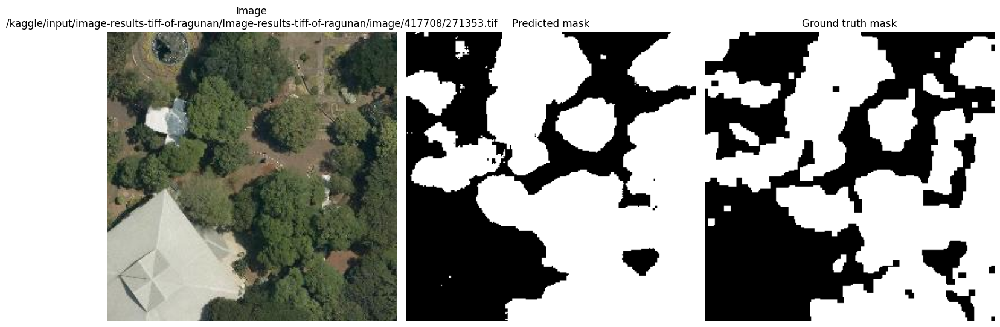

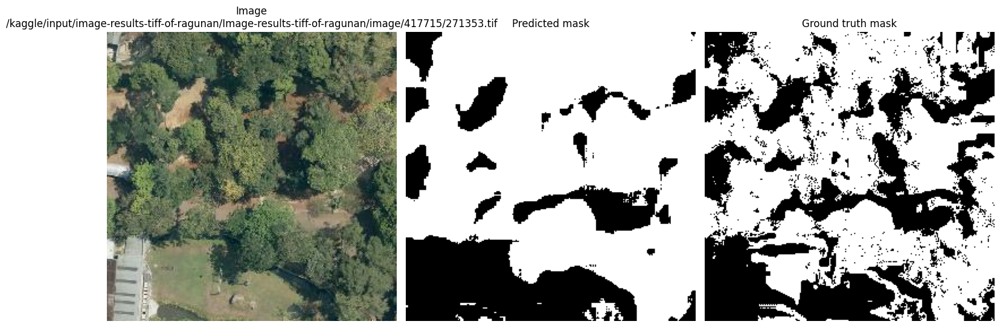

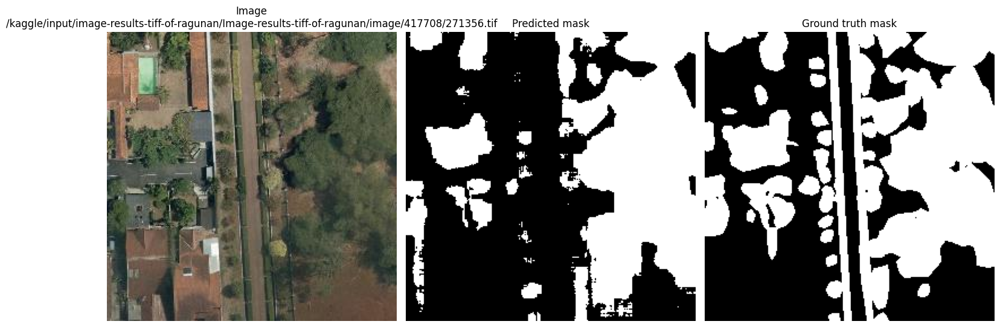

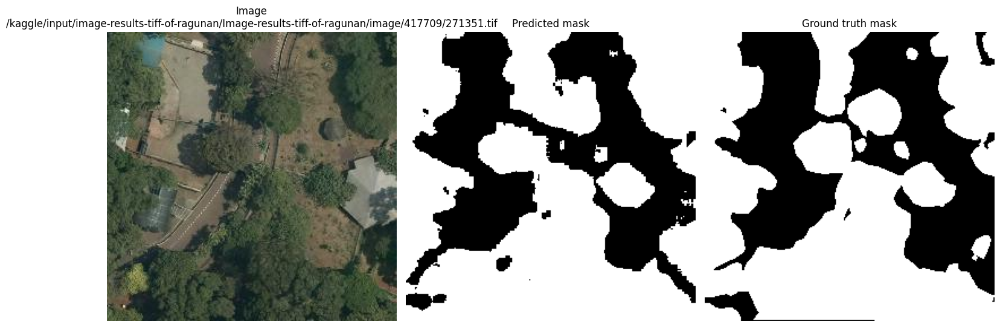

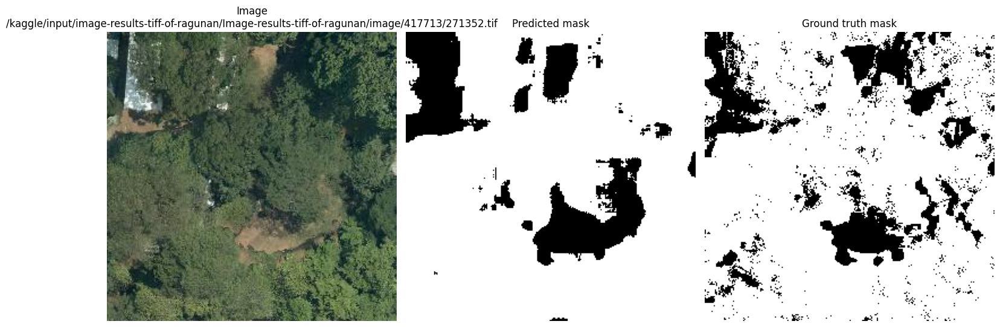

...

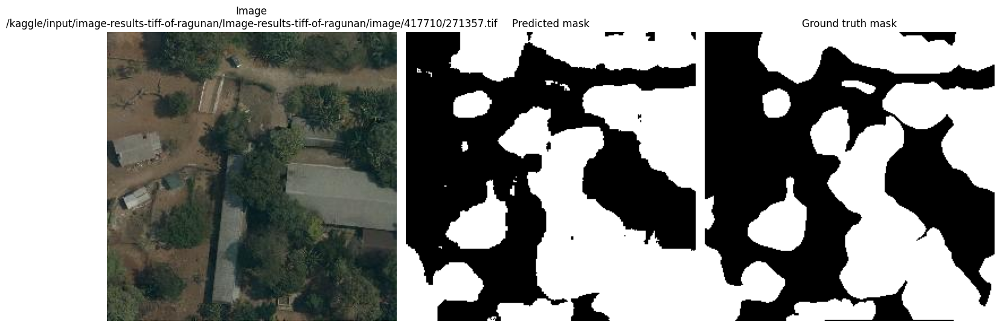

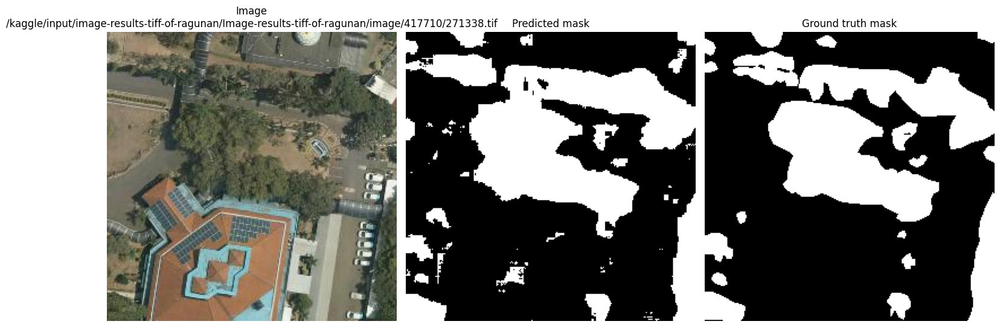

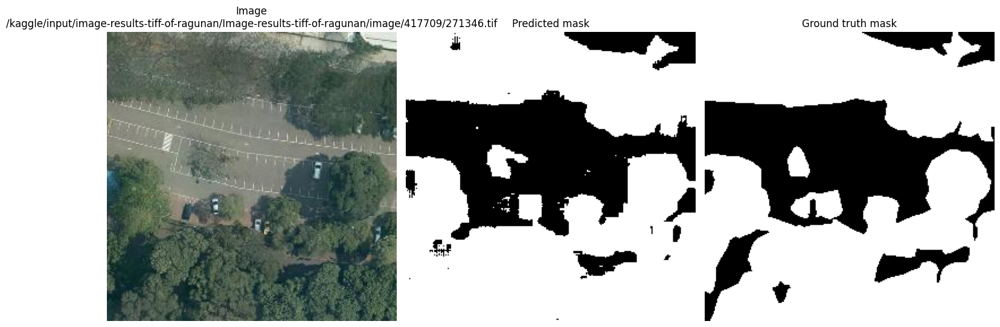

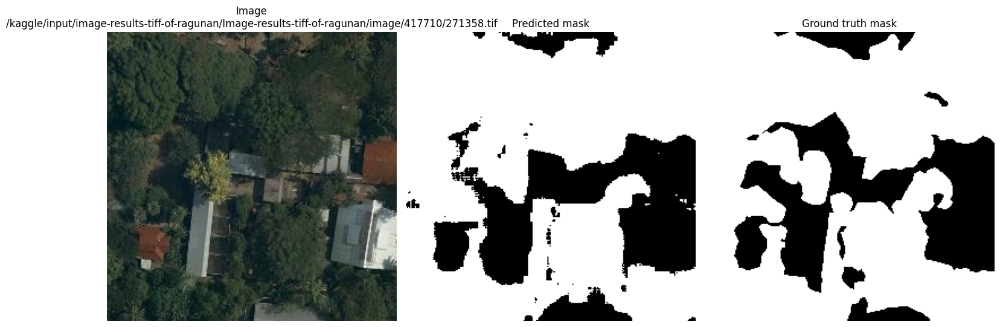

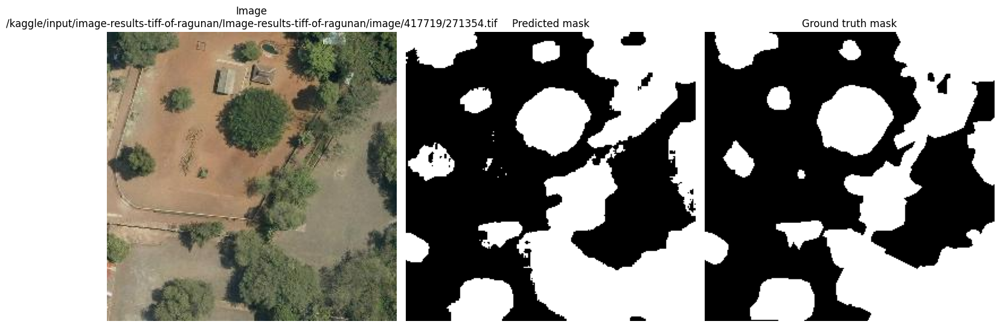

In [37]:
bin_masks = []
gt_masks = []
image_paths = []

for image, mask, image_path, mask_path in test_loader:
    for i in range(len(image_path)): 
        with rasterio.open(image_path[i]) as src:
            img = src.read([1, 2, 3])
            img = np.transpose(img, (1, 2, 0)) 

        gt_mask = cv2.imread(mask_path[i], cv2.IMREAD_GRAYSCALE)

        predictor_fine_tune.set_image(img)

        point = ref_point(gt_mask) 
        if len(point) == 0:
            print(f"No ref points in {mask_path[i]}")
            continue
            
        label = np.ones(len(point), dtype = np.int32)

        masks_fine_tune, scores, logits = predictor_fine_tune.predict(
            point_coords = point, point_labels = label, multimask_output = True
        )

        best_mask = masks_fine_tune[np.argmax(masks_fine_tune.sum(axis = (1, 2)))]
        best_mask = np.clip(best_mask, 0, 1)
        best_mask = (best_mask * 255).astype(np.uint8)

        _, bin_mask = cv2.threshold(best_mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        gt_masks.append(gt_mask)
        bin_masks.append(bin_mask)
        image_paths.append(image_path[i])

        plt.figure(figsize = (15, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title(f"Image\n{image_path[i]}")
        plt.axis("off")
    
        plt.subplot(1, 3, 2)
        plt.imshow(bin_mask, cmap = "gray")
        plt.title("Predicted mask")
        plt.axis("off")
    
        plt.subplot(1, 3, 3)
        plt.imshow(gt_mask, cmap = "gray")
        plt.title("Ground truth mask")
        plt.axis("off")
    
        plt.tight_layout()
        plt.show()

In [38]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 38026
Vegetation coverage area: 21402.170269834078
IoU score: 0.7663229400840582
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 46618
Vegetation coverage area: 3622.588270589526
IoU score: 0.7307035690614393
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 26769
Vegetation coverage area: 15066.393939756703
IoU score: 0.6535682919228263
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40395
Vegetation coverage area: 22735.514333612464
IoU score: 0.8227045850261172
Image /kaggle/input/i

In [41]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 21402.170269834078 m^2
Carbon density: 0.007078637547552205 ton/m^2
Estimated carbon stock: 151.498206071153 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3622.588270589526 m^2
Carbon density: 0.007078637547552205 ton/m^2
Estimated carbon stock: 25.642989351517226 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 15066.393939756703 m^2
Carbon density: 0.007078637547552205 ton/m^2
Estimated carbon stock: 106.64954184817478 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 22735.514333612464 m^2
Carbon density: 0.007078637547552205 ton/m^2
Estimated carbon stock: 160.9364654248205 ton
Image /kaggle/input/imag